# Prudential Life Insurance Prediction - Engineering 

In this notebook, we will build a baseline model and assess the contributions of each feature. In doing so, we will be able to identify the most important ones and engineer more features in an iterative approach.

In [314]:
# Common libraries 
import os
import pickle

# Data analytic/viz libraries s
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline

# ML libraries 
# from sklearn.tree import DecisionTreeClassifier 
# from sklearn.model_selection import RandomForestClassifier
import catboost
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler

# Model interpretation libraries
import shap
from sklearn.metrics import classification_report

In [35]:
# Get the data
data = pd.read_csv('cleaned_train.csv', index_col = 0)
data.head()

,Ins_Age,Ht,Wt,BMI,Employment_Info_3_3,Employment_Info_5_3,Employment_Info_1,Employment_Info_2,Employment_Info_4,Employment_Info_6,...,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Medical_Keyword_Count,Response
Id,,,,,,,,,,,,,,,,,,,,,
2,0.641791,0.581818,0.148536,0.323008,0,1,0.028,12,0.0,0.0000,...,0,0,0,0,0,0,0,0,0,8
5,0.059701,0.600000,0.131799,0.272288,1,0,0.000,1,0.0,0.0018,...,0,0,0,0,0,0,0,0,0,4
6,0.029851,0.745455,0.288703,0.428780,0,0,0.030,9,0.0,0.0300,...,0,0,0,0,0,0,0,0,0,8
7,0.164179,0.672727,0.205021,0.352438,0,1,0.042,9,0.0,0.2000,...,0,0,0,0,0,0,0,0,1,8
8,0.417910,0.654545,0.234310,0.424046,0,0,0.027,9,0.0,0.0500,...,0,0,0,0,0,0,0,0,0,8


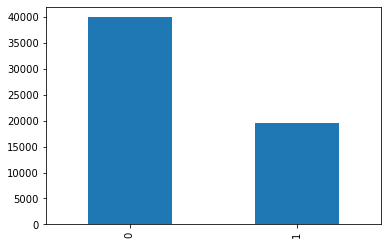

In [132]:
# Plot the frequency of each class 
data['Response'].value_counts().sort_index().plot.bar();

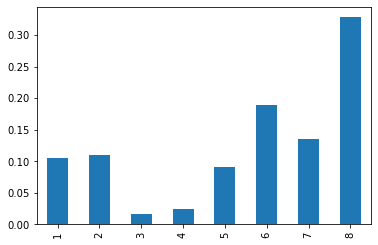

In [37]:
# Plot the relative proportion of each class 
(data['Response'].value_counts()/data.shape[0]).sort_index().plot.bar();

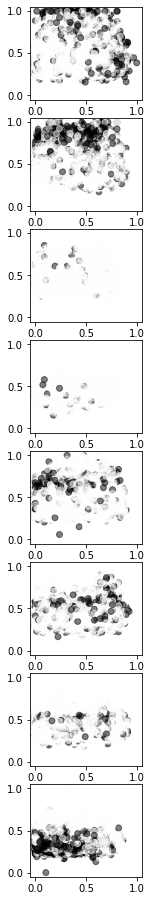

In [38]:
# Visualizing response
fig, axes = plt.subplots(nrows=8, ncols=1, figsize=(2, 16))
for i in range(1, 9):
    resp = data['Response'] == i
    axes[i-1].scatter(data['Ins_Age'], data['BMI'], c=resp, cmap='gray_r', alpha=0.5)

## Rethinking the Problem 

Across the previous notebooks, one thing has been certain. Response 8 is the majority class. Most columns when investigated tend to show differences across Response 8 vs other classes. Otherwise most distribution plots just reflect the overall response distribution.

For the purpose of feature engineering (and feature engineering alone, we will use multi class in the actual model) we will transform the response variable into is_response_8 and not_response_8.

In [39]:
data['Response'] = (data['Response'] == 8).astype('int')

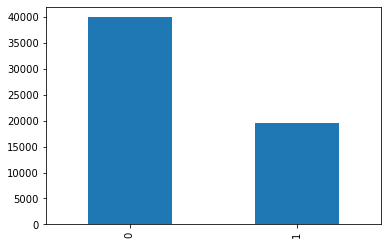

In [40]:
data['Response'].value_counts().plot.bar();

In [54]:
X_train, X_valid, y_train, y_valid = train_test_split(data.drop(columns='Response'), 
                                                        data['Response'], test_size=0.2,
                                                        stratify=data['Response'], 
                                                        random_state=0)

In [45]:
for col in data.columns:
    print(f'\'{col}\',')

'Ins_Age',
'Ht',
'Wt',
'BMI',
'Employment_Info_3_3',
'Employment_Info_5_3',
'Employment_Info_1',
'Employment_Info_2',
'Employment_Info_4',
'Employment_Info_6',
'InsuredInfo_1_2',
'InsuredInfo_1_3',
'InsuredInfo_2_3',
'InsuredInfo_4_3',
'InsuredInfo_5_3',
'InsuredInfo_6_2',
'InsuredInfo_7_3',
'InsuredInfo_3',
'Insurance_History_1_2',
'Insurance_History_2_2',
'Insurance_History_2_3',
'Insurance_History_3_2',
'Insurance_History_3_3',
'Insurance_History_4_2',
'Insurance_History_4_3',
'Insurance_History_7_2',
'Insurance_History_7_3',
'Insurance_History_8_2',
'Insurance_History_8_3',
'Insurance_History_9_2',
'Insurance_History_9_3',
'Insurance_History_5',
'Family_Hist_1_2',
'Family_Hist_1_3',
'Family_Hist_2_1',
'Family_Hist_3_1',
'Family_Hist_4_1',
'Family_Hist_5_1',
'Medical_History_3_2',
'Medical_History_3_3',
'Medical_History_4_2',
'Medical_History_5_2',
'Medical_History_5_3',
'Medical_History_6_2',
'Medical_History_6_3',
'Medical_History_7_2',
'Medical_History_7_3',
'Medical_History_8_2'

## CatBoost

Catboost is an open source library that uses gradient boosted decision trees to address regression and classification problems. Over recent years, many data scientists have started to use CatBoost in favour of XGBoost citing bester performance and faster training. In this case, CatBoost was mostly selected since this dataset has a very large number of categorical features.

In [48]:
# Explicitly define categorical features
physical_cont = ['Ins_Age', 'Ht', 'Wt', 'BMI']
employment_cont = [f'Employment_Info_{i}' for i in [1,2,4,6]]
insured_cont = ['InsuredInfo_3']
insured_hist_cont = ['Insurance_History_5']
medhist_cont = ['Medical_History_1', 'Medical_History_2']
medkey_cont = ['Medical_Keyword_Count']

continuous = physical_cont + employment_cont + insured_cont + insured_hist_cont + medhist_cont + medkey_cont
categorical = [col for col in data.columns if col not in (continuous + ['Response'])]

['Employment_Info_3_3',
 'Employment_Info_5_3',
 'InsuredInfo_1_2',
 'InsuredInfo_1_3',
 'InsuredInfo_2_3',
 'InsuredInfo_4_3',
 'InsuredInfo_5_3',
 'InsuredInfo_6_2',
 'InsuredInfo_7_3',
 'Insurance_History_1_2',
 'Insurance_History_2_2',
 'Insurance_History_2_3',
 'Insurance_History_3_2',
 'Insurance_History_3_3',
 'Insurance_History_4_2',
 'Insurance_History_4_3',
 'Insurance_History_7_2',
 'Insurance_History_7_3',
 'Insurance_History_8_2',
 'Insurance_History_8_3',
 'Insurance_History_9_2',
 'Insurance_History_9_3',
 'Family_Hist_1_2',
 'Family_Hist_1_3',
 'Family_Hist_2_1',
 'Family_Hist_3_1',
 'Family_Hist_4_1',
 'Family_Hist_5_1',
 'Medical_History_3_2',
 'Medical_History_3_3',
 'Medical_History_4_2',
 'Medical_History_5_2',
 'Medical_History_5_3',
 'Medical_History_6_2',
 'Medical_History_6_3',
 'Medical_History_7_2',
 'Medical_History_7_3',
 'Medical_History_8_2',
 'Medical_History_8_3',
 'Medical_History_9_2',
 'Medical_History_9_3',
 'Medical_History_11_2',
 'Medical_History

In [56]:
# Set params 
params = {'iterations': 4000,
         'learning_rate': 0.01,
         'cat_features': categorical,
         'depth': 3, 
         'eval_metric': 'AUC',
         'verbose': 200,
         'od_type': 'Iter', #overfit detector
         'od_wait': 500, #most recent best iter to wait before stopping
         'random_seed': 0}

In [57]:
# Instantiate model
cb = CatBoostClassifier(**params)
cb.fit(X_train, y_train,
      eval_set = (X_valid, y_valid),
      use_best_model = True,
      plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8343814	best: 0.8343814 (0)	total: 25.1ms	remaining: 1m 40s
200:	test: 0.8828268	best: 0.8828268 (200)	total: 3.12s	remaining: 59.1s
400:	test: 0.8914237	best: 0.8914237 (400)	total: 5.99s	remaining: 53.8s
600:	test: 0.8958853	best: 0.8958853 (600)	total: 8.9s	remaining: 50.4s
800:	test: 0.8984012	best: 0.8984012 (800)	total: 12.1s	remaining: 48.4s
1000:	test: 0.9001551	best: 0.9001551 (1000)	total: 15.1s	remaining: 45.1s
1200:	test: 0.9014967	best: 0.9014986 (1199)	total: 18.1s	remaining: 42.2s
1400:	test: 0.9025763	best: 0.9025763 (1400)	total: 21.1s	remaining: 39.2s
1600:	test: 0.9034242	best: 0.9034242 (1600)	total: 24.2s	remaining: 36.3s
1800:	test: 0.9041145	best: 0.9041145 (1800)	total: 27.4s	remaining: 33.4s
2000:	test: 0.9046565	best: 0.9046565 (2000)	total: 30.8s	remaining: 30.7s
2200:	test: 0.9051436	best: 0.9051436 (2200)	total: 33.9s	remaining: 27.7s
2400:	test: 0.9055205	best: 0.9055205 (2400)	total: 37.2s	remaining: 24.7s
2600:	test: 0.9058967	best: 0.9058970 

Within our first model, we ended up with an AUC value of ~.90 after 4000 iterations on our cross validation set, which is very impressive. From this, we can interpret that our baseline model with minimal feature engineering (we engineered features from nulls, and summed medkey instances) is able to distinguish whether or not an individual will receive Response 8.

Now, to examine the feature importances.

In [61]:
# Grab shap values 
shap_values = cb.get_feature_importance(Pool(X_train, y_train, cat_features = categorical),
                                        type='ShapValues')

In [95]:
def generate_force_plot(index, shap_values=shap_values, target=y_train):
    '''
    Create an interactive function that creates force plots based on index specified.
    '''
    # Get true value
    true_value = y_train.values[index]
    print(f'The true value for this is: {true_value}.')
    shap.initjs()
    expected_val = shap_values[index, -1]
    shap_values_ = shap_values[:, :-1]

    display(shap.force_plot(expected_val, shap_values_[index, :], X_train.iloc[index, :]))

In [114]:
# Randomly sample 5 from X_valid and view force plots
randints = np.random.randint(0, len(y_valid), size=5)
for i in randints:
    print(f'Sample: {i}')
    generate_force_plot(i)

Sample: 4117
The true value for this is: 1.


Sample: 200
The true value for this is: 0.


Sample: 3650
The true value for this is: 0.


Sample: 9986
The true value for this is: 0.


Sample: 1333
The true value for this is: 0.


Across the three examples above, it seems that BMI is a major contributing 

A better way to visualize feature importances is to use the summary plot from shap.

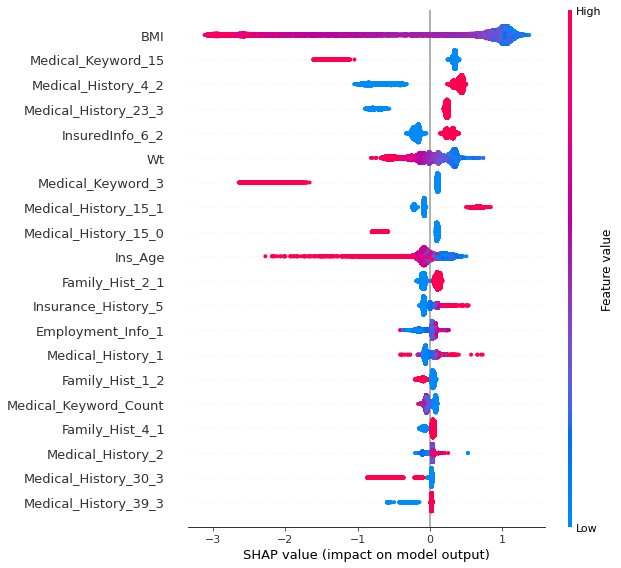

In [103]:
shap.summary_plot(shap_values[:, :-1], X_train)

And conventionally, our visualization of the feature importances in bar form.

Text(0.5, 1.0, 'Feature Importances')

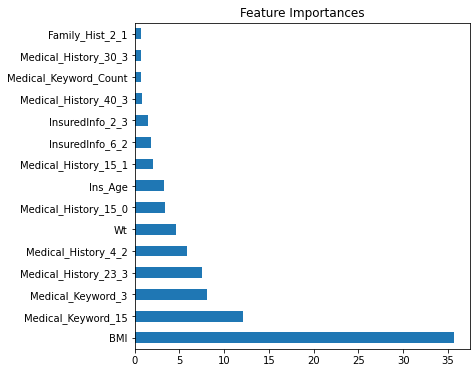

In [117]:
# Plot feature importances
plt.figure(figsize=(6,6))
pd.Series(cb.feature_importances_, index=data.iloc[:, :-1].columns).sort_values(ascending=False)[:15].plot.barh()
plt.title('Feature Importances')

As anticipated, it appears that BMI is the strongest predictor in terms determining whether or not a particular individual receives Response 8. Following that, it appears that Medical Keywords and Medical History are strong predictors.

In [126]:
# Create a classification matrix to assess performance overall
preds = cb.predict(X_valid)

print(classification_report(y_valid, preds))

              precision    recall  f1-score   support

           0       0.89      0.86      0.87      7979
           1       0.73      0.78      0.75      3898

    accuracy                           0.83     11877
   macro avg       0.81      0.82      0.81     11877
weighted avg       0.84      0.83      0.83     11877



In [128]:
# Compare scores to overall distribution of classes
y_valid.value_counts()/y_valid.shape[0]

0    0.671803
1    0.328197
Name: Response, dtype: float64

It appears that generally, the accuracy of the model is quite mediocre and does not predict the "minority" (minority because we grouped every other response into their own class) response 8 very well. 

## Feature Engineering - Iteration 1

Given the importance of BMI, I figured that it's likely a good idea to engineer more features using this one. BMI is derived from height and weight. 

$$BMI = \frac{m}{h^2}$$

We are provided both height and weight in their raw form. Some ideas that I have include:

- Calculating the Ponderal Index - A different body mass index that uses height^3 instead of height^2 more 'accurate' representation of health due to volume
    - Include a basic weight/height calculation -- Might as well.
- Including age in the equation - Overweight children are likelier to be healthier than overweight adults
- Transforming the BMI feature into a categorical one 

In [133]:
# Copy the original DataFrame
fe_1 = data.drop(columns='Response').copy()

In [146]:
# Calculate the Ponderal Index 
fe_1['PMI'] = fe_1['Wt']/(fe_1['Ht'] ** 3)

# Calculate Wt/Ht
fe_1['ht/wt'] = fe_1['Wt']/fe_1['Ht']

# Include Age in BMI equation 
fe_1['BMIxAge'] = fe_1['BMI'] * fe_1['Ins_Age']

# Transform BMI into a categorical one 
fe_1['BMI_q'] = pd.qcut(fe_1['BMI'], 4).cat.codes

In [162]:
# There is one record where ht is 0... fill the infinities as a result
fe_1.replace(np.inf, 1, inplace=True)

# There is 1 value where the PMI > 400... replace with highest value (6)
fe_1['PMI'] = fe_1['PMI'].where(fe_1['PMI'] < 10, 6)

In [183]:
fe_1_cat = categorical + ['BMI_q']

In [185]:
# Set params 
params = {'iterations': 4000,
         'learning_rate': 0.01,
         'cat_features': fe_1_cat,
         'depth': 3, 
         'eval_metric': 'AUC',
         'verbose': 200,
         'od_type': 'Iter', #overfit detector
         'od_wait': 500, #most recent best iter to wait before stopping
         'random_seed': 0}

# Set X_train, y_train, etc to be same as previous
X_train = fe_1.loc[X_train.index]
X_valid = fe_1.loc[X_valid.index]

# Instantiate model
cb_fe1 = CatBoostClassifier(**params)
cb_fe1.fit(X_train, y_train,
      eval_set = (X_valid, y_valid),
      use_best_model = True,
      plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8346688	best: 0.8346688 (0)	total: 55.3ms	remaining: 3m 41s
200:	test: 0.8825675	best: 0.8825675 (200)	total: 5.37s	remaining: 1m 41s
400:	test: 0.8910499	best: 0.8910499 (400)	total: 10.5s	remaining: 1m 34s
600:	test: 0.8954052	best: 0.8954052 (600)	total: 15.8s	remaining: 1m 29s
800:	test: 0.8979612	best: 0.8979612 (800)	total: 21s	remaining: 1m 24s
1000:	test: 0.8998299	best: 0.8998299 (1000)	total: 26.3s	remaining: 1m 18s
1200:	test: 0.9011532	best: 0.9011532 (1200)	total: 31.5s	remaining: 1m 13s
1400:	test: 0.9021987	best: 0.9021993 (1399)	total: 36.8s	remaining: 1m 8s
1600:	test: 0.9029980	best: 0.9029980 (1600)	total: 42.5s	remaining: 1m 3s
1800:	test: 0.9036737	best: 0.9036737 (1800)	total: 47.8s	remaining: 58.3s
2000:	test: 0.9042000	best: 0.9042000 (2000)	total: 53.2s	remaining: 53.2s
2200:	test: 0.9046197	best: 0.9046197 (2200)	total: 58.8s	remaining: 48s
2400:	test: 0.9050002	best: 0.9050002 (2400)	total: 1m 3s	remaining: 42.5s
2600:	test: 0.9053626	best: 0.90536

It appears that the performance has not improved very much.

In [186]:
shap_fe1 = cb.get_feature_importance(Pool(X_train, y_train, cat_features = fe_1_cat),
                                        type='ShapValues')

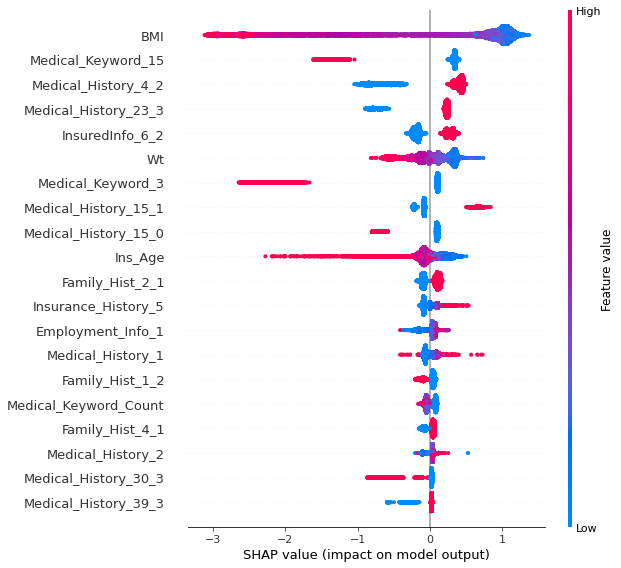

In [187]:
shap.summary_plot(shap_fe1[:, :-1], X_train)

Text(0.5, 1.0, 'Feature Importances')

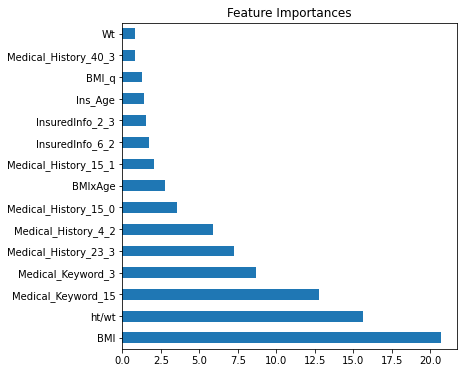

In [192]:
# Plot feature importances
plt.figure(figsize=(6,6))
pd.Series(cb_fe1.feature_importances_, index=fe_1.columns).sort_values(ascending=False)[:15].plot.barh()
plt.title('Feature Importances')

Despite all of this, it does appear as though our engineered ht/wt column is quite important. Our BMIxAge feature also appears to be quite important. Regardless, the overall performance has not improved.

## Multi-Class Feature Engineering

The above work uses a 1 vs all method of evaluating performance and feature engineering. However, our objective is to predict 8 different classes. While some feature may not be important in distinguishing if an applicant fits in Response 8, it may be important in distinguishing between responses 4 and 5. 

Therefore, I believe that the next steps would be to perform 1 vs all classification for the remaining responses and see if I can gather feature importances from that. However, doing this will severely imbalance the dataset since some minority classes are incredibly small.

In [201]:
# Reload data (you altered the previous response variable)
data = pd.read_csv('cleaned_train.csv', index_col = 0)

# Include first engineering data
# Calculate the Ponderal Index 
data['PMI'] = data['Wt']/(data['Ht'] ** 3)

# Calculate Wt/Ht
data['ht/wt'] = data['Wt']/data['Ht']

# Include Age in BMI equation 
data['BMIxAge'] = data['BMI'] * data['Ins_Age']

# Transform BMI into a categorical one 
data['BMI_q'] = pd.qcut(data['BMI'], 4).cat.codes

# There is one record where ht is 0... fill the infinities as a result
data.replace(np.inf, 1, inplace=True)

# There is 1 value where the PMI > 400... replace with highest value (6)
data['PMI'] = fe_1['PMI'].where(fe_1['PMI'] < 10, 6)

In [222]:
def generate_model(val_to_predict, categories, data=data, iters=2500):
    '''
    Create a 1 vs all dataset based on the response value you would like to predict
    INPUTS:
    val_to_predict - int value of the response desired
    categories - to tell catboost what categories are important
    '''
    print('*' * 50)
    print(f'CREATING MODEL FOR RESPONSE: {val_to_predict}')
    print('*' * 50)
    
    # Assign target variable to response
    y = (data['Response'] == val_to_predict).astype('int')

    # Drop response col
    X = data.drop(columns='Response')

    # Train test split 
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)

    # Random Over Sampling
    ros = RandomOverSampler(random_state=0)

    X_train_r, y_train_r = ros.fit_resample(X_train, y_train)

    # Create Catboost Model
    # Set params 
    params = {'iterations': iters,
             'learning_rate': 0.01,
             'cat_features': fe_1_cat,
             'depth': 3, 
             'eval_metric': 'AUC',
             'verbose': 500,
             'od_type': 'Iter', #overfit detector
             'od_wait': 500, #most recent best iter to wait before stopping
             'random_seed': 0}

    # Instantiate model
    cb= CatBoostClassifier(**params)
    cb.fit(X_train_r, y_train_r,
          eval_set = (X_valid, y_valid),
          use_best_model = True,
          plot=True);
    
    return cb

In [223]:
# Save models to a dictionary for feature importances analysis
cb_models = {}
# Create catboost classifiers for each individual class and identify which ones NEED feature engineering 
for i in range(1, 9):
    cb_models[i] = generate_model(i, fe_1_cat)

**************************************************
CREATING MODEL FOR RESPONSE: 1
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6771413	best: 0.6771413 (0)	total: 47.9ms	remaining: 1m 59s
500:	test: 0.7708685	best: 0.7708685 (500)	total: 19.7s	remaining: 1m 18s
1000:	test: 0.7801429	best: 0.7801429 (1000)	total: 40.3s	remaining: 1m
1500:	test: 0.7858458	best: 0.7858462 (1499)	total: 1m	remaining: 40.5s
2000:	test: 0.7888540	best: 0.7888746 (1998)	total: 1m 26s	remaining: 21.5s
2499:	test: 0.7903283	best: 0.7903283 (2499)	total: 1m 46s	remaining: 0us

bestTest = 0.7903283483
bestIteration = 2499

**************************************************
CREATING MODEL FOR RESPONSE: 2
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6911760	best: 0.6911760 (0)	total: 45.2ms	remaining: 1m 53s
500:	test: 0.7635987	best: 0.7635987 (500)	total: 22.8s	remaining: 1m 31s
1000:	test: 0.7744881	best: 0.7744881 (1000)	total: 42.8s	remaining: 1m 4s
1500:	test: 0.7785543	best: 0.7785631 (1497)	total: 1m 2s	remaining: 41.5s
2000:	test: 0.7804102	best: 0.7804166 (1999)	total: 1m 21s	remaining: 20.4s
2499:	test: 0.7812422	best: 0.7812441 (2430)	total: 1m 42s	remaining: 0us

bestTest = 0.7812441441
bestIteration = 2430

Shrink model to first 2431 iterations.
**************************************************
CREATING MODEL FOR RESPONSE: 3
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.9044397	best: 0.9044397 (0)	total: 53ms	remaining: 2m 12s
500:	test: 0.9183010	best: 0.9222596 (174)	total: 21.3s	remaining: 1m 25s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.9222595621
bestIteration = 174

Shrink model to first 175 iterations.
**************************************************
CREATING MODEL FOR RESPONSE: 4
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8980376	best: 0.8980376 (0)	total: 63.1ms	remaining: 2m 37s
500:	test: 0.9374777	best: 0.9374940 (496)	total: 21.6s	remaining: 1m 26s
1000:	test: 0.9388065	best: 0.9388934 (893)	total: 43.7s	remaining: 1m 5s
1500:	test: 0.9384846	best: 0.9390168 (1080)	total: 1m 5s	remaining: 43.9s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.9390167679
bestIteration = 1080

Shrink model to first 1081 iterations.
**************************************************
CREATING MODEL FOR RESPONSE: 5
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.7609513	best: 0.7609513 (0)	total: 53.4ms	remaining: 2m 13s
500:	test: 0.8083971	best: 0.8083971 (500)	total: 20.6s	remaining: 1m 22s
1000:	test: 0.8144334	best: 0.8144363 (999)	total: 42.3s	remaining: 1m 3s
1500:	test: 0.8165050	best: 0.8165230 (1490)	total: 1m 3s	remaining: 42s
2000:	test: 0.8171511	best: 0.8171716 (1980)	total: 1m 23s	remaining: 20.9s
2499:	test: 0.8177173	best: 0.8177173 (2499)	total: 1m 45s	remaining: 0us

bestTest = 0.8177172745
bestIteration = 2499

**************************************************
CREATING MODEL FOR RESPONSE: 6
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6603499	best: 0.6603499 (0)	total: 40.1ms	remaining: 1m 40s
500:	test: 0.7441994	best: 0.7441994 (500)	total: 19.2s	remaining: 1m 16s
1000:	test: 0.7567978	best: 0.7567978 (1000)	total: 37.4s	remaining: 56s
1500:	test: 0.7618193	best: 0.7618193 (1500)	total: 56.8s	remaining: 37.8s
2000:	test: 0.7647570	best: 0.7647570 (2000)	total: 1m 15s	remaining: 18.9s
2499:	test: 0.7668398	best: 0.7668398 (2499)	total: 1m 34s	remaining: 0us

bestTest = 0.7668398294
bestIteration = 2499

**************************************************
CREATING MODEL FOR RESPONSE: 7
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6830494	best: 0.6830494 (0)	total: 49.5ms	remaining: 2m 3s
500:	test: 0.7779760	best: 0.7779760 (500)	total: 20.2s	remaining: 1m 20s
1000:	test: 0.7887046	best: 0.7887046 (1000)	total: 40.6s	remaining: 1m
1500:	test: 0.7945327	best: 0.7945327 (1500)	total: 1m 1s	remaining: 40.9s
2000:	test: 0.7973982	best: 0.7974081 (1998)	total: 1m 24s	remaining: 21s
2499:	test: 0.7985480	best: 0.7985633 (2490)	total: 1m 47s	remaining: 0us

bestTest = 0.7985632934
bestIteration = 2490

Shrink model to first 2491 iterations.
**************************************************
CREATING MODEL FOR RESPONSE: 8
**************************************************


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8123031	best: 0.8123031 (0)	total: 39.1ms	remaining: 1m 37s
500:	test: 0.8942292	best: 0.8942292 (500)	total: 18.2s	remaining: 1m 12s
1000:	test: 0.9000672	best: 0.9000672 (1000)	total: 37.9s	remaining: 56.8s
1500:	test: 0.9027710	best: 0.9027710 (1500)	total: 57.7s	remaining: 38.4s
2000:	test: 0.9043043	best: 0.9043043 (2000)	total: 1m 18s	remaining: 19.5s
2499:	test: 0.9053076	best: 0.9053076 (2499)	total: 1m 37s	remaining: 0us

bestTest = 0.9053075508
bestIteration = 2499



## Looking Through Models for Areas of Interest 

Now that we have several one-vs-all classifiers, we should look how each of them did and see what features were the most important in determining their predictions

In [255]:
def evaluate_features(val_to_predict, cb_models = cb_models, cat_features = fe_1_cat):
    '''
    Return a classification report and a plot of feature importances for each catboost model.
    '''
    model = cb_models[val_to_predict]
    y = (data['Response'] == val_to_predict).astype('int')

    # Drop response col
    X = data.drop(columns='Response')

    # Train test split 
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)

    preds = model.predict(X_valid)
    
    print(classification_report(y_valid, preds))
    
    # Plot shap values
    shap_values = model.get_feature_importance(Pool(X_train, y_train, cat_features = cat_features),
                                            type='ShapValues')
    shap.initjs()
    shap.summary_plot(shap_values[:, :-1], X_train)
    
    # Plot feature importances
    pd.Series(model.feature_importances_, index=data.drop(columns='Response').columns).sort_values(
        ascending=False)[:20].plot.barh(figsize=(6,6))

              precision    recall  f1-score   support

           0       0.95      0.76      0.85     10636
           1       0.25      0.68      0.37      1241

    accuracy                           0.75     11877
   macro avg       0.60      0.72      0.61     11877
weighted avg       0.88      0.75      0.80     11877



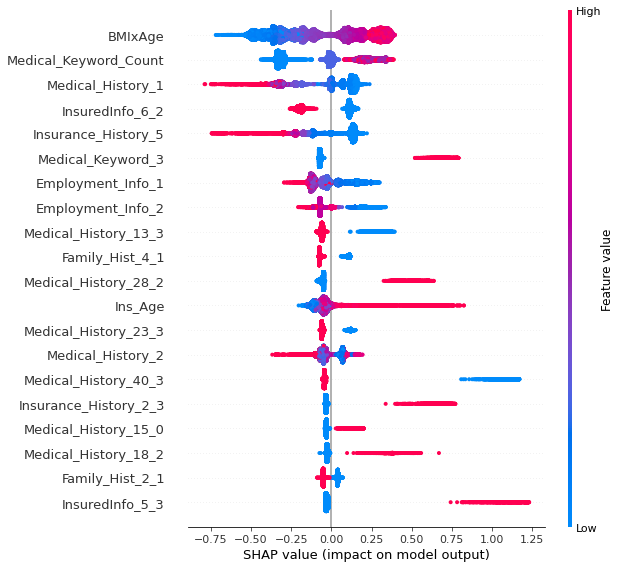

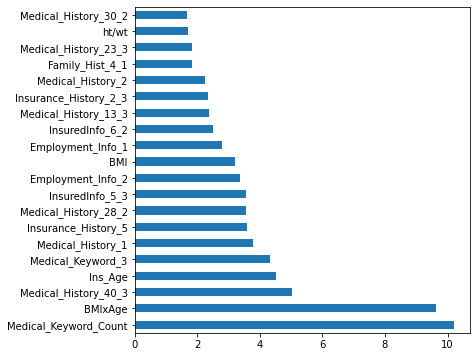

In [256]:
# Evaluate 1vs all prediction of Response 1
evaluate_features(1)

## Response 1
This model has poor precision when trying to predict Response 1.

It appears to make most of the engineered Medical Keyword Count, as well as the engineered BMI x Age feature. 

One feature engineering idea is to create categories/quartiles of the Medical Keyword Counts. Since Age appears to be a large factor as well, we could separate the ages into categories.

              precision    recall  f1-score   support

           0       0.95      0.75      0.83     10567
           1       0.24      0.66      0.36      1310

    accuracy                           0.74     11877
   macro avg       0.60      0.70      0.60     11877
weighted avg       0.87      0.74      0.78     11877



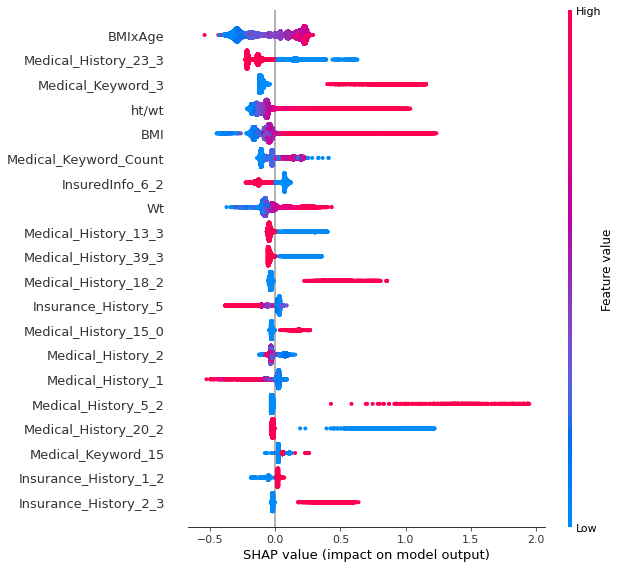

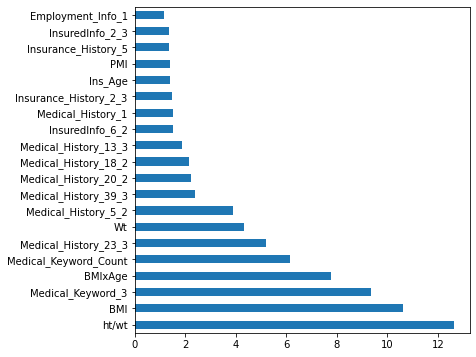

In [257]:
evaluate_features(2)

## Response 2 

Again, not great predictors of response 2. 

The physical indicators once again appear to be the biggest in terms of feature importances. There are some medical keywords that are incredibly useful again.

              precision    recall  f1-score   support

           0       1.00      0.89      0.94     11674
           1       0.12      0.88      0.21       203

    accuracy                           0.89     11877
   macro avg       0.56      0.88      0.57     11877
weighted avg       0.98      0.89      0.93     11877



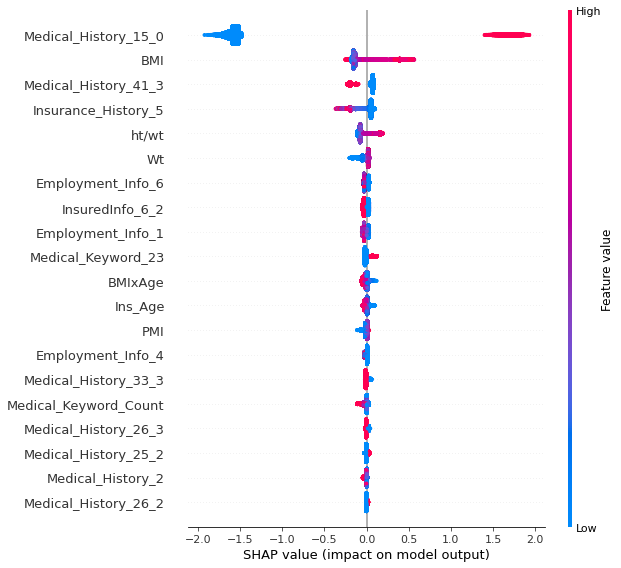

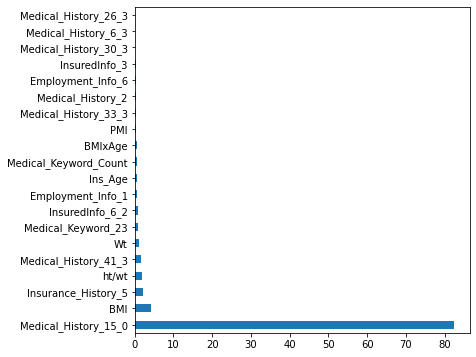

In [258]:
evaluate_features(3)

## Response 3

There are very little datapoints for this response, so it's no wonder that one feature is more important than any other. The precision is awful, but it seems to only predict based on one column. It's unclear what kind of features could be created from what little is being given here.

              precision    recall  f1-score   support

           0       1.00      0.92      0.95     11591
           1       0.20      0.86      0.33       286

    accuracy                           0.91     11877
   macro avg       0.60      0.89      0.64     11877
weighted avg       0.98      0.91      0.94     11877



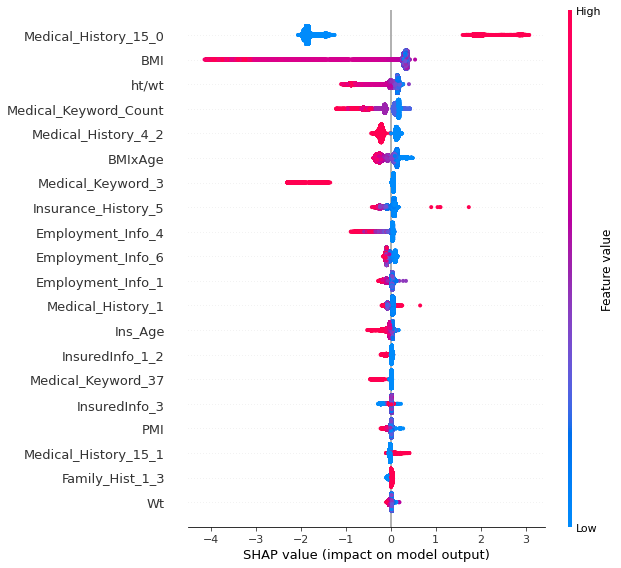

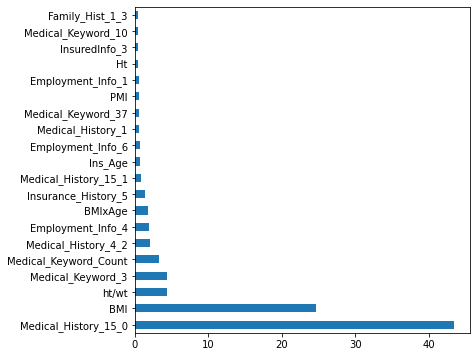

In [259]:
evaluate_features(4)

## Response 4

Resposne 4, like response 3 has very little datapoints. It also appears to rely heavily on Medical History 15. In terms of model selection, it may be useful to group these two together, or eliminate it from the realm of prediction entirely. These account for less than 3% of the data. Is it truly necessary to have a model that can predict these accurately?

              precision    recall  f1-score   support

           0       0.96      0.81      0.88     10791
           1       0.27      0.68      0.39      1086

    accuracy                           0.80     11877
   macro avg       0.62      0.75      0.63     11877
weighted avg       0.90      0.80      0.84     11877



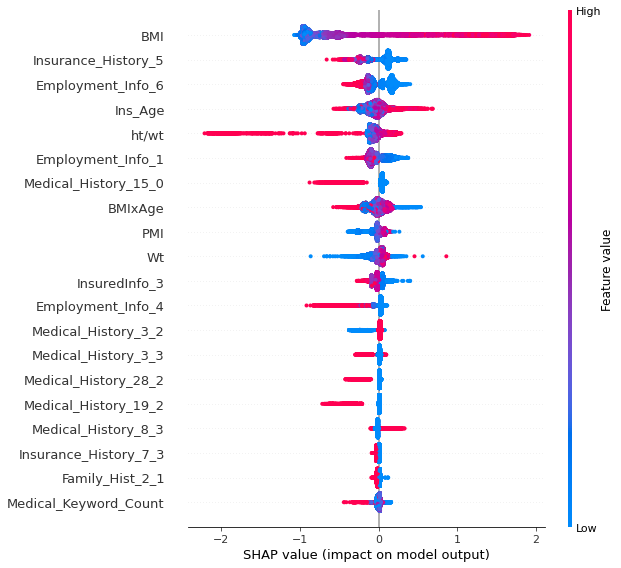

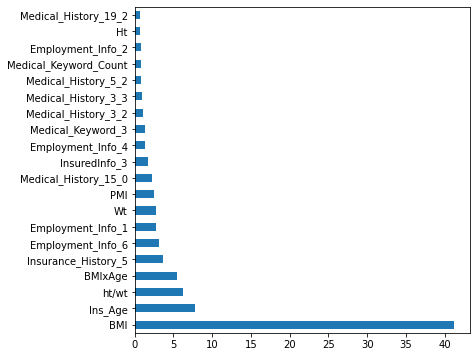

In [260]:
evaluate_features(5)

## Response 5 
This response appears to heavily depend on BMI, like many other models. When so many of these responses depend on BMI, it seems all the more necessary to come up with some sort of feature that can separate them better.

              precision    recall  f1-score   support

           0       0.91      0.69      0.78      9630
           1       0.35      0.71      0.47      2247

    accuracy                           0.69     11877
   macro avg       0.63      0.70      0.63     11877
weighted avg       0.80      0.69      0.72     11877



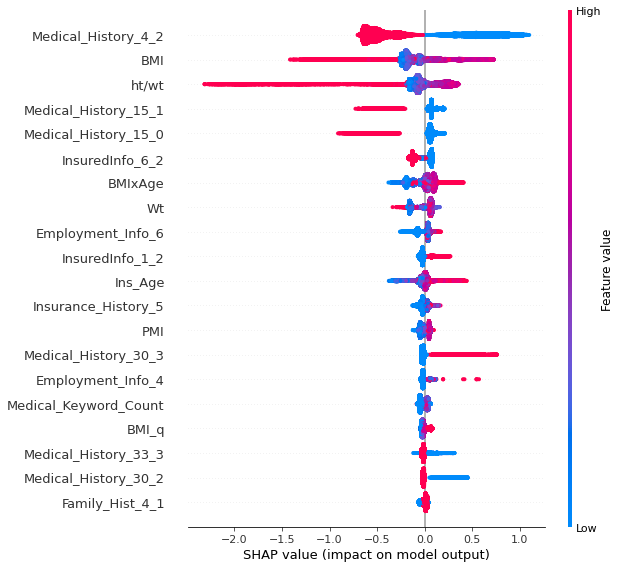

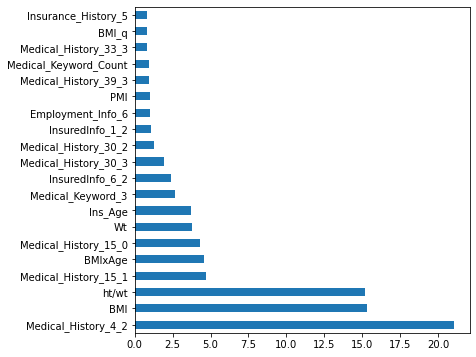

In [261]:
evaluate_features(6)

## Response 6 

One categorical variable wrt Medical History appears to be the largest contributor to whether or not a feature belongs to Response 6. Again, physical features are important in determining class.

              precision    recall  f1-score   support

           0       0.95      0.69      0.80     10271
           1       0.28      0.75      0.40      1606

    accuracy                           0.70     11877
   macro avg       0.61      0.72      0.60     11877
weighted avg       0.86      0.70      0.75     11877



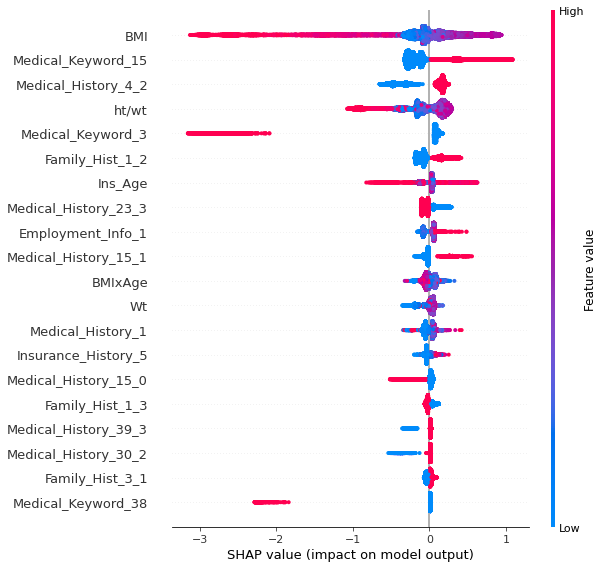

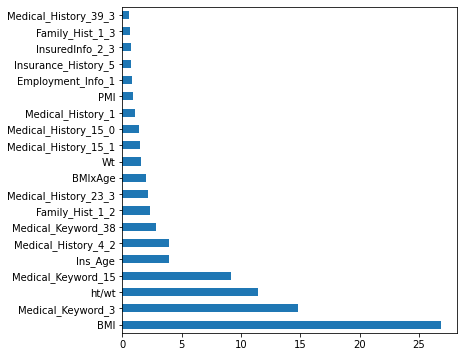

In [262]:
evaluate_features(7)

## Response 7 

Medical Keywords and BMI values appear to be the most important when it comes to this value.

              precision    recall  f1-score   support

           0       0.93      0.79      0.85      7979
           1       0.67      0.88      0.76      3898

    accuracy                           0.82     11877
   macro avg       0.80      0.83      0.81     11877
weighted avg       0.84      0.82      0.82     11877



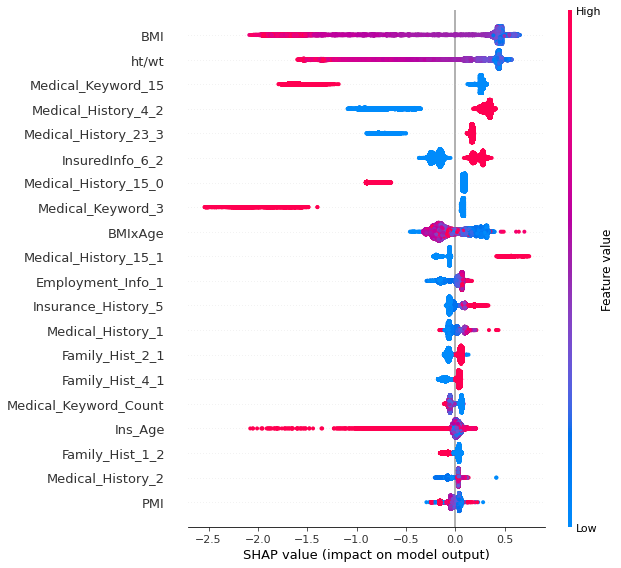

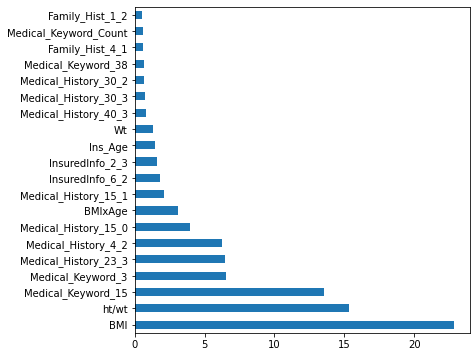

In [264]:
evaluate_features(8)

## Response 8

Again, physical features appear to be the largest contributing factors when it comes to this.

## Conclusions Across Responses
- Response 1
    - Categorize Medical Keyword Counts
- Response 2
    - Physical Indicators 
- Response 3 
    - Highly dependent on one categorical variable 
- Response 4 
    - Highly dependent on one categorical variable, BMI
- Response 5 
    - Medical Categories and BMI
- Response 6 
    - Physical Indicators 
- Response 7
    - Physical Indicators 
- Response 8
    - Physical Indicators
    
Beyond continuing to find minor adjustments between physical indicators, it does not seem like further feature engineering would be too helpful.

In [315]:
# Transform BMI into smaller quantiles
data['BMI_q'] = pd.qcut(data['BMI'], 10).cat.codes

# Transform Medical Keyword Count into quantiles 
data['Medical_Keyword_Count_Q'] = pd.cut(data['Medical_Keyword_Count'], 5).cat.codes

fe_1_cat += ['Medical_Keyword_Count_Q']

In [313]:
# Export for model building
data.to_csv('train_processed.csv')

In [324]:
# Export categorical list 
with open('categorical_vars.pickle', 'wb') as f:
    pickle.dump(temp, f)

In [318]:
with open('categorical_vars.pickle', 'rb') as f:
    temp = pickle.load(f)

Processing steps for future test dataset...

    # Calculate the Ponderal Index 
    fe_1['PMI'] = fe_1['Wt']/(fe_1['Ht'] ** 3)

    # Calculate Wt/Ht
    fe_1['ht/wt'] = fe_1['Wt']/fe_1['Ht']

    # Include Age in BMI equation 
    fe_1['BMIxAge'] = fe_1['BMI'] * fe_1['Ins_Age']

    # Transform BMI into a categorical one 
    fe_1['BMI_q'] = pd.qcut(fe_1['BMI'], 4).cat.codes
    
    # There is one record where ht is 0... fill the infinities as a result
    fe_1.replace(np.inf, 1, inplace=True)

    # There is 1 value where the PMI > 400... replace with highest value (6)
    fe_1['PMI'] = fe_1['PMI'].where(fe_1['PMI'] < 10, 6)
    
    # Transform BMI into smaller quantiles
    data['BMI_q'] = pd.qcut(data['BMI'], 10).cat.codes

    # Transform Medical Keyword Count into quantiles 
    data['Medical_Keyword_Count_Q'] = pd.cut(data['Medical_Keyword_Count'], 5).cat.codes